# Interactive labeling with Jupyter

In this example, the active learning workflow of modAL is demonstrated - with you in the loop! By running this notebook, you'll be queried to label digits using the [DIGITS dataset](http://archive.ics.uci.edu/ml/datasets/Optical+Recognition+of+Handwritten+Digits). If you would like to try this out, you can [download this notebook here](https://github.com/modAL-python/modAL/blob/master/docs/source/content/examples/interactive_labeling.ipynb)!

In [5]:
!cat /proc/meminfo | grep Mem

MemTotal:       32407904 kB
MemFree:        22649284 kB
MemAvailable:   29889856 kB


In [ ]:
!pip install scikit-cuda

In [53]:
!pip3 install matplotlib

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [54]:
import numpy as np

from modAL.models import ActiveLearner
from modAL.uncertainty import uncertainty_sampling

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from IPython import display
from matplotlib import pyplot as plt
import pandas as pd
%matplotlib inline

## The dataset

Now we set up the initial training set for our classifier. If you would like to play around, you can try to modifiy the value ```n_initial``` below and see if it impacts the algorithm!

In [55]:
n_initial = 35000

In [56]:
#Data for ERGO
path = '/home/guddu/Lumiq/Ergo/Ergo_pairs_test2_output.csv'
df=pd.read_csv(path,delimiter='\t')
Xdf = df[['NAMESIM','EMAILSIM','PHONESIM','ADDRESSSIM','PINSIM','CITYSIM','STATESIM','REGSIM','CHASSISSIM']]
X = Xdf.values
df2 = df['PREDICTED']
df2 = df2.replace('X','-1')
y = df2.values

In [57]:
y = np.array([int(item) for item in y])

In [58]:
#Load digit data
X, y = load_digits(return_X_y=True)
n_initial=100

In [59]:
print(X.shape)
print(y.shape)

(1797, 64)
(1797,)


In [60]:
unique, counts = np.unique(y, return_counts=True)
dict(zip(unique, counts))

{0: 178,
 1: 182,
 2: 177,
 3: 183,
 4: 181,
 5: 182,
 6: 181,
 7: 179,
 8: 174,
 9: 180}

In [61]:
#Get the training and test splits
X_train, X_test, y_train, y_test = train_test_split(X, y)
#Select a set of random indices, which will be used to get rows from the training data
initial_idx = np.random.choice(range(len(X_train)), size=n_initial, replace=False)
#Initial rows sampled from training data
X_initial, y_initial = X_train[initial_idx], y_train[initial_idx]
#Rest of the rows considered as pool in the training data
X_pool, y_pool = np.delete(X_train, initial_idx, axis=0), np.delete(y_train, initial_idx, axis=0)



(array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., 10.,  0.,  0.],
       [ 0.,  0.,  0., ..., 16.,  9.,  0.],
       ...,
       [ 0.,  0.,  1., ...,  6.,  0.,  0.],
       [ 0.,  0.,  2., ..., 12.,  0.,  0.],
       [ 0.,  0., 10., ..., 12.,  1.,  0.]]), array([0, 1, 2, ..., 8, 9, 8]))
(array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., 10.,  0.,  0.],
       [ 0.,  0.,  0., ..., 16.,  9.,  0.],
       ...,
       [ 0.,  0.,  1., ...,  6.,  0.,  0.],
       [ 0.,  0.,  2., ..., 12.,  0.,  0.],
       [ 0.,  0., 10., ..., 12.,  1.,  0.]]), None, None)


In [62]:
print("Training data"+str(X_train.shape))
print("Initial data"+str(X_initial.shape))
print("Pool data"+str(X_pool.shape))
print("Test data"+str(X_test.shape))

Training data(1347, 64)
Initial data(100, 64)
Pool data(1247, 64)
Test data(450, 64)


In [63]:
for item in y_test:
    if item!=-1:
        print(item)

9
1
2
0
1
5
4
3
0
2
5
1
9
9
9
8
8
8
5
6
4
7
0
4
1
7
1
2
6
8
1
8
2
7
8
3
5
6
6
9
7
4
6
4
7
4
0
0
8
4
1
9
5
9
0
6
7
2
0
4
2
6
7
5
8
4
3
7
5
3
4
9
2
0
3
4
9
1
8
1
3
9
3
1
0
1
1
7
7
9
2
0
6
5
8
2
1
1
4
2
7
5
5
1
8
8
2
5
9
6
5
7
5
2
6
6
8
6
0
1
0
4
5
9
3
0
1
8
4
7
8
1
3
9
5
9
0
3
6
6
1
9
6
1
3
2
2
7
7
3
5
5
8
7
9
8
8
1
5
3
7
8
0
9
2
6
8
0
9
0
4
5
0
7
0
3
9
4
9
4
5
8
7
0
5
2
3
4
4
8
4
2
6
8
8
9
6
0
7
1
3
8
1
3
5
4
9
3
4
3
9
5
4
4
7
0
2
9
9
5
5
2
7
1
9
9
3
6
1
3
4
7
4
8
4
1
0
9
7
0
8
3
6
8
6
0
9
0
8
7
8
7
2
0
7
6
1
4
6
3
0
4
2
8
3
8
7
5
1
2
7
3
6
3
0
1
1
7
6
9
9
2
4
0
9
9
6
4
4
2
9
4
6
8
9
3
7
6
7
3
3
0
5
1
3
5
0
8
8
4
1
0
7
7
8
7
1
9
5
2
2
6
7
2
3
5
1
5
3
5
2
2
6
2
1
9
6
8
2
4
4
6
2
5
7
6
9
0
4
8
7
4
4
1
3
1
1
4
7
9
1
4
3
5
9
1
4
7
2
3
4
7
2
8
2
1
6
3
6
7
3
0
8
4
6
5
6
6
3
0
4
7
1
7
1
7
4
6
7
6
4
3
2
6
4
1
9
8
9
2
3
3
4
2
3
8
1
8
4
2
8
5
7
2
5
4
6
7
0
5
7
9
1
1
8
8
7
6
8
9
8
8
5
1
0
2
4
9
8
9


## Initializing the learner

Now we initialize the active learner. Feel free to change the underlying ```RandomForestClassifier``` or the ```uncertainty_sampling```!

In [64]:
learner = ActiveLearner(
    estimator=RandomForestClassifier(),
    query_strategy=uncertainty_sampling,
    X_training=X_initial, y_training=y_initial
)

(array([[ 0.,  0., 14., ..., 10.,  1.,  0.],
       [ 0.,  0.,  8., ...,  7.,  1.,  0.],
       [ 0.,  3., 14., ..., 11.,  1.,  0.],
       ...,
       [ 0.,  0.,  2., ..., 11.,  0.,  0.],
       [ 0.,  1.,  8., ...,  4.,  0.,  0.],
       [ 0.,  2.,  9., ...,  8.,  0.,  0.]], dtype=float32), array([3, 2, 2, 5, 8, 6, 4, 6, 4, 6, 9, 1, 5, 4, 1, 0, 7, 2, 3, 3, 1, 3,
       0, 0, 8, 9, 3, 3, 7, 8, 0, 8, 5, 0, 7, 4, 4, 6, 8, 6, 0, 2, 5, 4,
       0, 2, 5, 4, 8, 3, 0, 3, 9, 7, 6, 0, 5, 1, 7, 0, 2, 7, 9, 6, 4, 5,
       5, 0, 3, 1, 5, 3, 2, 7, 7, 0, 6, 9, 5, 5, 8, 2, 8, 1, 9, 9, 2, 5,
       6, 4, 9, 7, 0, 2, 5, 7, 9, 8, 5, 5]))


We also set how many queries we want to make. The more the better! (Usually :) )

In [65]:
n_queries = 10

## The active learning loop

In [66]:
!pip3 install tabulate

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [67]:
from tabulate import tabulate

(array([9, 1, 2, 0, 1, 5, 4, 3, 0, 2, 5, 1, 9, 9, 9, 8, 8, 8, 5, 6, 4, 7,
       0, 4, 1, 7, 1, 2, 6, 8, 1, 8, 2, 7, 8, 3, 5, 6, 6, 9, 7, 4, 6, 4,
       7, 4, 0, 0, 8, 4, 1, 9, 5, 9, 0, 6, 7, 2, 0, 4, 2, 6, 7, 5, 8, 4,
       3, 7, 5, 3, 4, 9, 2, 0, 3, 4, 9, 1, 8, 1, 3, 9, 3, 1, 0, 1, 1, 7,
       7, 9, 2, 0, 6, 5, 8, 2, 1, 1, 4, 2, 7, 5, 5, 1, 8, 8, 2, 5, 9, 6,
       5, 7, 5, 2, 6, 6, 8, 6, 0, 1, 0, 4, 5, 9, 3, 0, 1, 8, 4, 7, 8, 1,
       3, 9, 5, 9, 0, 3, 6, 6, 1, 9, 6, 1, 3, 2, 2, 7, 7, 3, 5, 5, 8, 7,
       9, 8, 8, 1, 5, 3, 7, 8, 0, 9, 2, 6, 8, 0, 9, 0, 4, 5, 0, 7, 0, 3,
       9, 4, 9, 4, 5, 8, 7, 0, 5, 2, 3, 4, 4, 8, 4, 2, 6, 8, 8, 9, 6, 0,
       7, 1, 3, 8, 1, 3, 5, 4, 9, 3, 4, 3, 9, 5, 4, 4, 7, 0, 2, 9, 9, 5,
       5, 2, 7, 1, 9, 9, 3, 6, 1, 3, 4, 7, 4, 8, 4, 1, 0, 9, 7, 0, 8, 3,
       6, 8, 6, 0, 9, 0, 8, 7, 8, 7, 2, 0, 7, 6, 1, 4, 6, 3, 0, 4, 2, 8,
       3, 8, 7, 5, 1, 2, 7, 3, 6, 3, 0, 1, 1, 7, 6, 9, 9, 2, 4, 0, 9, 9,
       6, 4, 4, 2, 9, 4, 6, 8, 9, 3, 7, 6, 7, 3, 3

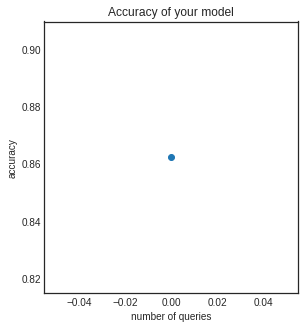

What label will you assign on this set of similarity values?
+----+-----------+------------+------------+--------------+----------+-----------+------------+----------+--------------+
|    |   NAMESIM |   EMAILSIM |   PHONESIM |   ADDRESSSIM |   PINSIM |   CITYSIM |   STATESIM |   REGSIM |   CHASSISSIM |
|----+-----------+------------+------------+--------------+----------+-----------+------------+----------+--------------|
|  0 |         0 |          0 |          1 |           11 |       14 |        15 |          3 |        0 |            0 |
+----+-----------+------------+------------+--------------+----------+-----------+------------+----------+--------------+


KeyboardInterrupt: 

In [68]:
#Get accuracy on test data
accuracy_scores = [learner.score(X_test, y_test)]
#For i in range(0,20)
for i in range(n_queries):
    #Clear the output
    #display.clear_output(wait=True)
    #Query the pool. Get the index and instance (example)
    query_idx, query_inst = learner.query(X_pool)
    with plt.style.context('seaborn-white'):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 1, 1)
        #plt.title('Digit to label')
        #Convert the sampled instance to the digit picture
        #plt.imshow(query_inst.reshape(8, 8))
        plt.subplot(1, 2, 2)
        plt.title('Accuracy of your model')
        #Previous accuracy of the model
        plt.plot(range(i+1), accuracy_scores)
        plt.scatter(range(i+1), accuracy_scores)
        plt.xlabel('number of queries')
        plt.ylabel('accuracy')
        display.display(plt.gcf())
        plt.close('all')
        
    print("What label will you assign on this set of similarity values?")
    simdict=dict()
    simdict['NAMESIM'] = [query_inst[0][0]]
    simdict['EMAILSIM'] = [query_inst[0][1]]
    simdict['PHONESIM'] = [query_inst[0][2]]
    simdict['ADDRESSSIM'] = [query_inst[0][3]]
    simdict['PINSIM'] = [query_inst[0][4]]
    simdict['CITYSIM'] = [query_inst[0][5]]
    simdict['STATESIM'] = [query_inst[0][6]]
    simdict['REGSIM'] = [query_inst[0][7]]
    simdict['CHASSISSIM'] = [query_inst[0][8]]
    
    simdf = pd.DataFrame(simdict)
    
    #print('NAMESIM','EMAILSIM','PHONESIM','ADDRESSSIM','PINSIM','CITYSIM','STATESIM','REGSIM','CHASSISSIM')
    #print(simdf)
    print(tabulate(simdf, headers='keys', tablefmt='psql'))
    #Get the input from user on this digit
    y_new = np.array([int(input())], dtype=int)
    #Teach the learner based on this new label entered by a human
    learner.teach(query_inst.reshape(1, -1), y_new)
    #Delete this example from the pool, as it has already been given feedback on
    X_pool, y_pool = np.delete(X_pool, query_idx, axis=0), np.delete(y_pool, query_idx, axis=0)
    #Based on the teaching (from this example), recalculate the accuracy on the test set
    accuracy_scores.append(learner.score(X_test, y_test))

In [ ]:
accuracy_scores

In [ ]:
for item in y_test:
    if item!=-1:
        print(item)

In [ ]:
#Get accuracy on test data
accuracy_scores = [learner.score(X_test, y_test)]
#For i in range(0,20)
for i in range(n_queries):
    #Clear the output
    display.clear_output(wait=True)
    #Query the pool. Get the index and instance (example)
    query_idx, query_inst = learner.query(X_pool)
    with plt.style.context('seaborn-white'):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title('Digit to label')
        #Convert the sampled instance to the digit picture
        plt.imshow(query_inst.reshape(8, 8))
        plt.subplot(1, 2, 2)
        plt.title('Accuracy of your model')
        #Previous accuracy of the model
        plt.plot(range(i+1), accuracy_scores)
        plt.scatter(range(i+1), accuracy_scores)
        plt.xlabel('number of queries')
        plt.ylabel('accuracy')
        display.display(plt.gcf())
        plt.close('all')
        
    print("Which digit is this?")
    #Get the input from user on this digit
    y_new = np.array([int(input())], dtype=int)
    #Teach the learner based on this new label entered by a human
    learner.teach(query_inst.reshape(1, -1), y_new)
    #Delete this example from the pool, as it has already been given feedback on
    X_pool, y_pool = np.delete(X_pool, query_idx, axis=0), np.delete(y_pool, query_idx, axis=0)
    #Based on the teaching (from this example), recalculate the accuracy on the test set
    accuracy_scores.append(learner.score(X_test, y_test))

Finally, we can visualize the accuracy during the training.

In [ ]:
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.title('Accuracy of the classifier during the active learning')
    plt.plot(range(n_queries+1), accuracy_scores)
    plt.scatter(range(n_queries+1), accuracy_scores)
    plt.xlabel('number of queries')
    plt.ylabel('accuracy')
    plt.show()

# Logistic Regression on ERGO Data

In [8]:
!pip3 install modAL

In [153]:
!pip3 install tabulate

  Using cached tabulate-0.8.9-py3-none-any.whl (25 kB)


In [36]:
import pandas as pd
import numpy as np
from modAL.models import ActiveLearner
from modAL.uncertainty import uncertainty_sampling

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

from IPython import display
from matplotlib import pyplot as plt

In [135]:
#Final test set
#path = '/home/guddu/Dedupe_anirban/final_test_set_output_with_percentage3.tsv'
path = 'Ergo_Oct20_output.csv' #Ergo big data (sent by Parul)
df=pd.read_csv(path,delimiter='\t')

In [136]:
df = df.drop('Index',axis=1)

In [137]:
df.columns

Index(['customer_code_x', 'name_x', 'chassis_num_x', 'veh_reg_num_x',
       'gender_x', 'mobile_x', 'email_x', 'dob_x', 'pan_x', 'pincode_x',
       'city_x', 'state_x', 'add_line1_x', 'add_line2_x', 'full_add_x',
       'landmark_x', 'customer_code_y', 'name_y', 'chassis_num_y',
       'veh_reg_num_y', 'gender_y', 'mobile_y', 'email_y', 'dob_y', 'pan_y',
       'pincode_y', 'city_y', 'state_y', 'add_line1_y', 'add_line2_y',
       'full_add_y', 'landmark_y', 'overallmatchtype', 'profilematchtype',
       'FINAL SCORE', 'PREDICTED', 'REASON', 'DOBSIM', 'GENDERSIM', 'NAMESIM',
       'EMAILSIM', 'PHONESIM', 'ADDRESSSIM', 'PINSIM', 'CITYSIM', 'STATESIM',
       'REGSIM', 'CHASSISSIM', 'PERCENTAGE'],
      dtype='object')

In [54]:
#path = '/home/guddu/Lumiq/Ergo/Ergo_Sep2_sample_output.csv'
#df1=pd.read_csv(path,delimiter='\t')

/usr/lib/python3/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (22,32) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [138]:
#df1['LABEL']=1
#df1['full_add_x'] = df1['a_add_line1']+' '+df1['a_add_line2']
#df1['full_add_y'] = df1['b_add_line1']+' '+df1['b_add_line2']
df1=df.drop('add_line1_x',axis='columns')
df1=df1.drop('add_line2_x',axis='columns')
df1=df1.drop('add_line1_y',axis='columns')
df1=df1.drop('add_line2_y',axis='columns')
#df1=df1.drop('REASON',axis='columns')


In [56]:
#df1=df1.drop('Unnamed: 32',axis='columns')

In [53]:
#df1=df1.replace('EXACT',1)
#df1=df1.replace('PARTIAL',0)

In [57]:
'''
df1 = df1[['a_policy_num', 'a_customer_code', 'a_name', 'a_chassis_num',
       'a_veh_reg_num', 'a_gender', 'a_mobile', 'a_email', 'a_dob', 'a_pan',
       'a_pincode', 'a_city', 'a_state', 'full_add_x', 'a_landmark', 'b_policy_num',
       'b_customer_code', 'b_name', 'b_chassis_num', 'b_veh_reg_num',
       'b_gender', 'b_mobile', 'b_email', 'b_dob', 'b_pan', 'b_pincode',
       'b_city', 'b_state','full_add_y','b_landmark', 'FINAL SCORE', 'PREDICTED', 'DOBSIM',
       'GENDERSIM', 'NAMESIM', 'EMAILSIM', 'PHONESIM', 'ADDRESSSIM', 'PINSIM',
       'CITYSIM', 'STATESIM', 'REGSIM', 'CHASSISSIM', 'PERCENTAGE', 'LABEL']]
'''

In [58]:
#df1=df1.drop('PERCENTAGE',axis='columns')

In [59]:
#path = '/home/guddu/Lumiq/Ergo/Ergo_pairs_test2_output.csv'
#df2 = pd.read_csv(path,delimiter = '\t')

In [65]:
'''
df3 = df2[['policy_num_x', 'customer_code_x', 'name_x', 'chassis_num_x', 'veh_reg_num_x', 'gender_x',
        'mobile_x', 'email_x','dob_x',  'pan_x','pincode_x', 'city_x', 'state_x', 'full_add_x','landmark_x',
        'policy_num_y', 'customer_code_y', 'name_y', 'chassis_num_y', 'veh_reg_num_y', 'gender_y',
        'mobile_y', 'email_y','dob_y',  'pan_y', 'pincode_y', 'city_y', 'state_y', 'full_add_y','landmark_y',
        'FINAL SCORE', 'PREDICTED', 'REASON', 'DOBSIM', 'GENDERSIM', 'NAMESIM',
        'EMAILSIM', 'PHONESIM', 'ADDRESSSIM', 'PINSIM', 'CITYSIM', 'STATESIM','REGSIM', 'CHASSISSIM']]
df3['LABEL'] = df3['PREDICTED']
'''

/usr/lib/python3/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [66]:
#df3 = df3.drop('REASON',axis='columns')

In [67]:
#df3.columns = df1.columns

In [139]:
print(df1.shape)
#df_final=pd.concat([df1,df3])
#print(df3.shape)
#print(df_final.shape)

(1048575, 45)


In [140]:
df_final=df1
print(df_final.shape)
#NOT FOR ERGO DATA
#df_final=df
#df_final.columns

(1048575, 45)


In [141]:
df_final2 = df_final.drop('profilematchtype',axis='columns')

In [142]:
df_final2 = df_final2.replace('PARTIAL','0')
df_final2 = df_final2.replace('EXACTPARTIAL','1')
df_final2 = df_final2.replace('EXACT','1')
#print(df_final2[df_final2['overallmatchtype']==1].shape[0])

In [143]:
df_final2.shape

(1048575, 44)

In [123]:
#Class balancing code: Need not be run everytime
sample_size = df_final2[df_final2['overallmatchtype']==1].shape[0]
print(sample_size)
df_final = df_final2.groupby('overallmatchtype',as_index=False).apply(lambda x: x.sample(sample_size))
df_final=df_final.reset_index(drop=True)

0


In [144]:
print(df_final2.shape)

(1048575, 44)


In [145]:
df_final2.head()

,customer_code_x,name_x,chassis_num_x,veh_reg_num_x,gender_x,mobile_x,email_x,dob_x,pan_x,pincode_x,...,NAMESIM,EMAILSIM,PHONESIM,ADDRESSSIM,PINSIM,CITYSIM,STATESIM,REGSIM,CHASSISSIM,PERCENTAGE
0,23152035868682,HARISH KODANGAI,MC2C1RC0KF445686,NaN,MALE,8.147842e+09,HARISH474@GMAIL.COM,NaN,NaN,574243.0,...,0.85,-0.5,-0.500000,0.68,-0.5,-0.5,0.0,0.262393,0.417087,11.182927
1,23112034817593,RAJ KUMAR SANGRA,MALC381CLJM450880,JK-02-CD-4260,MALE,NaN,NaN,NaN,NaN,NaN,...,1.00,-0.5,-0.500000,0.98,-0.5,-0.5,-0.5,-0.500000,0.482726,15.297561
2,23111010301584,BHUPENDRA M NAKUM,MBJ11JV4007393832,MH-43-AN-2368,MALE,9.323153e+09,BHUPENDRANAKUM@YAHOO.COM,1964-05-28,NaN,NaN,...,1.00,0.0,-0.500000,0.72,-0.5,-0.5,-0.5,0.423831,0.538282,14.409756
3,23152026129015,SANJIT HAZRA,MAT445553HVP58912,WB-19-J-3627,MALE,NaN,NaN,1985-10-20,NaN,NaN,...,1.00,-0.5,-0.500000,1.00,-0.5,-0.5,-0.5,0.000000,0.483754,15.365854
4,23201005992778,SANJEEV KUMAR,MBLHA10EJA9D01877,HR-07-P-5123,MALE,NaN,NaN,1999-01-11,NaN,136118.0,...,1.00,-0.5,0.494444,0.46,0.6,-0.5,0.0,0.386752,0.460317,11.951220


In [146]:
df_final2['overallmatchtype'].unique()

array(['1', '0'], dtype=object)

In [163]:
#Data for ERGO
#path = '/home/guddu/Lumiq/Ergo/Ergo_pairs_test2_output.csv'
#path = '/home/guddu/Lumiq/Ergo/Ergo_sample.csv'
#df=pd.read_csv(path,delimiter='\t')
df=df_final2
Xdf = df[['NAMESIM','EMAILSIM','PHONESIM','ADDRESSSIM','PINSIM','CITYSIM','STATESIM','REGSIM','CHASSISSIM']]
#Xdf = df[['dob_sim','gender_sim','name_sim','email_sim','phone_sim','address_sim']]
X = Xdf.values
df2 = df['overallmatchtype']
#df2 = df['predicted']

#IF NO MATCH EXISTS (ELSE NOT NEEDED)
#df2 = df2.replace('X','-1')
y = df2.values
y = np.array([int(item) for item in y])

In [164]:
unique, counts = np.unique(y, return_counts=True)
dict(zip(unique, counts))

{0: 259919, 1: 788656}

In [165]:
n_initial = 2000

In [19]:
def print_misclassified_examples(X_test,y_test,X_test_copy,y_test_copy):
    #Print the first 10 misclassified examples finally
    predictions = learner.estimator.predict(X_test)
    index = 0
    misclassifiedIndexes = []
    for label, predict in zip(y_test, predictions):
        if str(label) != str(predict):
            misclassifiedIndexes.append(index)
        index +=1
    #print(misclassifiedIndexes)
    c=0        
    for mi in misclassifiedIndexes:
        #print("index:"+str(mi))
        print("Misclassified:"+str(X_test_copy[mi]))
        print("Ground Truth:"+str(y_test_copy[mi]))
        print("Predicted:"+str(predictions[mi]))
        print('\n')
        c+=1
        if c>20:
            break

            
def get_misclassified_examples(X_test, y_test, X_test_copy, y_test_copy, n,randomized = True):
    #Return n misclassified examples randomly and delete them from test data
    #Also return the new test data
    predictions = learner.estimator.predict(X_test)
    index = 0
    misclassifiedIndexes = []
    for label, predict in zip(y_test, predictions):
        if str(label) != str(predict):
            misclassifiedIndexes.append(index)
        index +=1
    #print(misclassifiedIndexes)
    if randomized == True:
        if n>len(misclassifiedIndexes):
            print("You cannot sample more misclassified indices, than there ARE misclassified indices!")
            print("I am proceeding with the number of misclassified indices (max limit)")
            n=len(misclassifiedIndexes)
        else:
            random_misclassified_indexes = random.sample(misclassifiedIndexes, n)
        
        #Delete the misclassified rows (the n selected) from the test arrays
        #Store them in the new lists
        list_of_test_rows_X = X_test[random_misclassified_indexes]
        list_of_test_rows_y = y_test[random_misclassified_indexes]
    
        X_test = np.delete(X_test, random_misclassified_indexes, axis=0)
        y_test = np.delete(y_test, random_misclassified_indexes, axis=0)
    
        X_test_copy = np.delete(X_test_copy, random_misclassified_indexes, axis=0)
        y_test_copy = np.delete(y_test_copy, random_misclassified_indexes, axis=0)
    else:
        list_of_test_rows_X = []
        list_of_test_rows_y = []
        print("####CAME HERE####")
        count=0
        while count<n-1:
            print("Shape of test data:"+str(X_test.shape[0]))
            if X_test.shape[0]==0:
                break
            predictions2 = learner.estimator.predict(X_test)
            idx, inst = learner.query(X_test)
            #print("\nPredictions and ground truth####\n")
            #print(predictions2[idx])
            #print(y_test[idx])
            #print("####NOOOO :(####")
            
            #if predictions2[idx]!=y_test[idx]:
            #print("####ALRIGHT####")
            y_new = np.array(y_test[idx],dtype=int)
            list_of_test_rows_X.append(inst)
            list_of_test_rows_y.append(y_new)
            count+=1
            X_test = np.delete(X_test, idx, axis = 0)
            y_test = np.delete(y_test, idx, axis = 0)
            X_test_copy = np.delete(X_test_copy, idx, axis = 0)
            y_test_copy = np.delete(y_test_copy, idx, axis = 0)
                
        '''
        X_test_misclassified = X_test[misclassifiedIndexes]
        y_test_misclassified = y_test[misclassifiedIndexes]
        for i in range(0,n):
            idx, inst = learner.query(X_test_misclassified)
            X_test_misclassified = np.delete(X_test_misclassified, idx, axis=0)
            y_test_misclassified = np.delete(y_test_misclassified, idx, axis=0)
            #y_new = np.array(y_test_misclassified[idx],dtype=int)
            #X_new = np.array(X_test_misclassified[idx],dtype=int)
            random_misclassified_indexes = indices_selected.append(idx)
        '''
    
    return(list_of_test_rows_X,list_of_test_rows_y,X_test,y_test,X_test_copy,y_test_copy)


In [171]:
from sklearn.preprocessing import StandardScaler
#Get the training and test splits
X_train, X_test, y_train, y_test = train_test_split(X, y)
#Get copies of the original data so that they are not touched by normalization
X_train_copy=X_train
X_test_copy=X_test
y_train_copy=y_train
y_test_copy=y_test

#Normalize training and test data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#Select a set of random indices, which will be used to get rows from the training data
initial_idx = np.random.choice(range(len(X_train)), size=n_initial, replace=False)
#Initial rows sampled from training data
X_initial, y_initial = X_train[initial_idx], y_train[initial_idx]
X_initial_copy, y_initial_copy = X_train_copy[initial_idx], y_train_copy[initial_idx]
#Rest of the rows considered as pool in the training data
X_pool, y_pool = np.delete(X_train, initial_idx, axis=0), np.delete(y_train, initial_idx, axis=0)
X_pool_copy, y_pool_copy = np.delete(X_train_copy, initial_idx, axis=0), np.delete(y_train_copy, initial_idx, axis=0)


print("**********************************")
print(y_initial.shape)
print(y_test.shape)
print(y_pool.shape)
print("**********************************")


unique2, counts2 = np.unique(y_pool, return_counts=True)
print(dict(zip(unique2, counts2)))
print("**********************************")

from modAL.uncertainty import margin_sampling,entropy_sampling,classifier_entropy
learner = ActiveLearner(
    #estimator=RandomForestClassifier(),
    #(solver='sag', max_iter=6000)-> 94.71% accuracy
    estimator=LogisticRegression(solver='sag', max_iter=10000), #Number of iterations needs to be customized, regularization
    query_strategy=margin_sampling,
    X_training=X_initial, y_training=y_initial
)
print("**********************************")
accuracy_scores = [learner.score(X_test, y_test)]
print("Accuracy before active learning:"+str(accuracy_scores))
print('\n\n')
print(learner.estimator.coef_)
print('\n')
print(learner.estimator.predict_proba(X_test).shape)
print("**********************************")

**********************************
(2000,)
(262144,)
(784431,)
**********************************
{0: 194713, 1: 589718}
**********************************
**********************************
Accuracy before active learning:[0.7514610290527344]



[[ 0.07503078 -0.51179449 -0.22229701  0.08025638 -0.47373808  0.04427779
   0.68815878 -0.05456576 -0.02099219]]


(262144, 2)
**********************************


In [ ]:
from tabulate import tabulate
import random
#Get accuracy on test data

#For i in range(0,20)
n_queries=2000
num_misclassified_examples_for_pooling = 0
count_one_selected=0
for i in range(n_queries):
    #Clear the output
    display.clear_output(wait=True)
    
    #If number of 1 selected pool data instances are less than n_queries/2
    #if count_one_selected<int(n_queries/2):
    #    #Select another 1 value
    #    print("GETTING 1 INDEX")
    #    indices = np.where(y_pool == 1)[0]
    #    label_selected=1
    #    count_one_selected+=1
    #    #one_index = random.choice(one_indices)
    #else:
    #    print("GETTING 0 INDEX")
    #    label_selected=-1
    #    indices = np.where(y_pool == -1)[0]
        
    #indices = [item for item in indices]
    #print("$$$")
    #print(X_pool.shape)
    #print("************************************")
    #print("Label Selected:"+str(label_selected))
    #print(indices)
    #print("************************************")
    #Select rows with only 1/-1 labels and assign them to X_pool and X_pool_copy
    #X_pool=X_pool[indices,:]
    #X_pool_copy = X_pool_copy[indices,:]
    #print(X_pool.shape)
    
    #Query the pool. Get the index and instance (example)
    #query_idx, query_inst = learner.query(X_pool[indices,:])
    query_idx, query_inst = learner.query(X_pool)
    #print("\n************************************")
    #print('Query Index selected:'+str(query_idx))
    #print('Is query index present in indices:'+str(query_idx in indices))
    #print(y_pool[query_idx])
    #print("************************************")
    #print("Query instance:"+str(query_inst))
    #print("Query instance after indexing:"+str(X_pool[query_idx]))
    
        
    #print("\nWhat label will you assign on this set of similarity values?\n")
    #Here we need to show the un-normalized data to the user 
    simdict=dict()
    #ERGO DATA
    simdict['NAMESIM'] = [X_pool_copy[query_idx][0][0]]
    simdict['EMAILSIM'] = [X_pool_copy[query_idx][0][1]]
    simdict['PHONESIM'] = [X_pool_copy[query_idx][0][2]]
    simdict['ADDRESSSIM'] = [X_pool_copy[query_idx][0][3]]
    simdict['PINSIM'] = [X_pool_copy[query_idx][0][4]]
    simdict['CITYSIM'] = [X_pool_copy[query_idx][0][5]]
    simdict['STATESIM'] = [X_pool_copy[query_idx][0][6]]
    simdict['REGSIM'] = [X_pool_copy[query_idx][0][7]]
    simdict['CHASSISSIM'] = [X_pool_copy[query_idx][0][8]]
    
    #FINAL TEST DATA
    #simdict['dob_sim'] = [X_pool_copy[query_idx][0][0]]
    #simdict['gender_sim'] = [X_pool_copy[query_idx][0][1]]
    #simdict['name_sim'] = [X_pool_copy[query_idx][0][2]]
    #simdict['email_sim'] = [X_pool_copy[query_idx][0][3]]
    #simdict['phone_sim'] = [X_pool_copy[query_idx][0][4]]
    #simdict['address_sim'] = [X_pool_copy[query_idx][0][5]]
    
    
    simdf = pd.DataFrame(simdict)
    #print(simdf.columns)
    
    #print('NAMESIM','EMAILSIM','PHONESIM','ADDRESSSIM','PINSIM','CITYSIM','STATESIM','REGSIM','CHASSISSIM')
    #print(simdf)
    #print(tabulate(simdf, headers='keys', tablefmt='psql'))
    #Get the input from user on this digit
    #y_new = np.array([int(input())], dtype=int)
    
    #Get input from the pool label
    y_new = np.array(y_pool[query_idx],dtype=int)
    #print("***")
    #print(y_new)
    
    #Teach the learner based on this new label entered by a human
    #By default, teach does training on the whole training data plus the new queried examples seen till now
    print("$$$$")
    print(query_inst.reshape(1, -1).shape)
    print(y_new.shape)
    learner.teach(query_inst.reshape(1, -1), y_new)
    print("\n\nESTIMATOR COEFFICIENTS: Iteration-"+str(i))
    print(learner.estimator.coef_.shape)
    print(pd.DataFrame(learner.estimator.coef_.transpose(),simdf.columns,columns=['coef1']).sort_values(by=['coef1'], ascending=False))
    #Delete this example from the pool, as it has already been given feedback on
    X_pool, y_pool = np.delete(X_pool, query_idx, axis=0), np.delete(y_pool, query_idx, axis=0)
    X_pool_copy, y_pool_copy = np.delete(X_pool_copy, query_idx, axis=0), np.delete(y_pool_copy, query_idx, axis=0)
    
    
    
    #Based on the teaching (from this example), recalculate the accuracy on the test set
    accuracy_scores.append(learner.score(X_test, y_test))

    
first_set_acc = learner.score(X_test, y_test)


print("********************************************************")
print("Now sampling points from test data for misclassification")
print("********************************************************")

#New test data, and sampled misclassified examples
num_misclassified_examples_for_pooling = 70
print("Test set size originally:"+str(X_test.shape[0]))
lotrx, lotry, X_test, y_test, X_test_copy, y_test_copy = get_misclassified_examples(X_test, y_test, X_test_copy, y_test_copy, num_misclassified_examples_for_pooling, False)
print("Test set X size after removing some misclassified examples:"+str(X_test.shape[0]))
print("Test set y size after removing some misclassified examples:"+str(y_test.shape[0]))
for i in range(len(lotrx)):
    print("$$$$")
    
    X_new = lotrx[i].reshape(1,-1)
    #print(X_new.shape)
    y_new2 = np.reshape(lotry[i],(1,))
    print(y_new2.shape)
    #learner.teach(query_inst.reshape(1, -1), y_new)
    learner.teach(X_new, y_new)
    accuracy_scores.append(learner.score(X_test, y_test))


print("The accuracy after first set of active learning:"+str(first_set_acc))
print("The accuracy after second set of active learning:"+str(learner.score(X_test, y_test)))

print("**********************")
print("MISCLASSIFIED EXAMPLES")
print("**********************")
print_misclassified_examples(X_test,y_test,X_test_copy,y_test_copy)
print("**********************")    
#for i in range(0,len(accuracy_scores)):
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 1, 1)
    #plt.title('Digit to label')
    #Convert the sampled instance to the digit picture
    #plt.imshow(query_inst.reshape(8, 8))
    #plt.subplot(1, 2, 2)
    plt.title('Accuracy of your model')
    #Previous accuracy of the model
    plt.plot(range(n_queries+num_misclassified_examples_for_pooling), accuracy_scores)
    plt.scatter(range(n_queries+num_misclassified_examples_for_pooling), accuracy_scores)
    plt.xlabel('number of queries')
    plt.ylabel('accuracy')
    plt.savefig("accuracy_change.ergo.margin.alltest.large"+str(n_queries)+".png")
    display.display(plt.gcf())
    plt.close('all')
    

$$$$
(1, 9)
(1,)


ESTIMATOR COEFFICIENTS: Iteration-1687
(1, 9)
               coef1
STATESIM    0.652120
NAMESIM     0.097898
ADDRESSSIM  0.093798
CITYSIM     0.048427
REGSIM     -0.015495
CHASSISSIM -0.040955
PHONESIM   -0.208318
PINSIM     -0.405232
EMAILSIM   -0.517239


In [ ]:
#TODO
#Different dataset
#Classification study [train set: diff chassis no and address, pool: same chassis and address]
#Lots of training examples
#Dataset to test it



clf = LogisticRegression(random_state=0).fit(X_initial, y_initial)
#clf.predict(X[:2, :])

In [ ]:
print(clf.classes_)
print(clf.coef_)
print(clf.predict_proba(X[:5, :]))
print(clf.predict(X[:5, :]))

# Intelligent Active Learning Ergo
We keep only negative samples in training data, and positive samples in pool, so that the learner learns from it.

In [2]:
import pandas as pd

In [ ]:
#Imran Khan imr@123 98XXXXXX PAN ....
#....
#....
#Imran K imr@456 97XXXXXXXX PAN
#Lumiq AURUM
#R-SWOOSH (SERF)
#Equation: c1*namesim+c2*addresssim+c3*PANsim = 7 (c3 = 10, c3 = -10|c1 = 4, c1 = -1)
#Threshold: 9
#If score>Threshold: Exact Match (100% confident)
#If score>7 and score<9: PM
#If score<7: NM

#Pairwise
#<cust1 details><cust2 details><PREDICTION>
#Prediction: Exact Match, Partial Match, No Match

In [9]:
!pip3 install fastparquet

     |████████████████████████████████| 1.3 MB 30.6 MB/s eta 0:00:01
     |████████████████████████████████| 1.5 MB 104.6 MB/s eta 0:00:01
     |████████████████████████████████| 59 kB 15.9 MB/s  eta 0:00:01
  Created wheel for thrift: filename=thrift-0.15.0-cp38-cp38-linux_x86_64.whl size=413781 sha256=568d667145f2d0caff208ec043b23571d61d263e0f3d416ba1a0d22533407f69
  Stored in directory: /home/ubuntu/.cache/pip/wheels/4c/b5/5b/10af165d7e0895afdfe25ad487422ae8ada6ea422b0dc444ab
Successfully built thrift


In [10]:
#Read parquet files
#from pyspark.sql import SparkSession
#spark = SparkSession \
#    .builder \
#    .appName("Python Spark SQL basic example") \
#    .config("spark.some.config.option", "some-value") \
#    .getOrCreate()
#df_parq = spark.read.parquet("part-00000-99aef096-bbfa-4146-97b6-f8e8f413b171-c000.snappy.parquet")
df_parq = pd.read_parquet("part-00000-99aef096-bbfa-4146-97b6-f8e8f413b171-c000.snappy.parquet")

In [11]:
df_parq.to_csv("sample_parquet.csv")

In [12]:
df_parq = pd.read_csv("sample_parquet.csv")
df_parq.head()

,Unnamed: 0,id,component
0,0,23111000000263,171798691840
1,1,23111000000655,85899345920
2,2,23111000001249,128849018880
3,3,23111000001680,0
4,4,23111000001776,146028888064


In [2]:
df = pd.read_csv('Ergo_Oct20_output.csv',delimiter = '\t')
df = df.drop('Index',axis=1)
df = df.drop('overallmatchtype',axis=1)
df = df.drop('profilematchtype',axis=1)
df = df.drop('PREDICTED',axis=1)
#df=df.replace('EXACT','1')
#df=df.replace('EXACTPARTIAL','1')
#df=df.replace('PARTIAL','0')

In [7]:
#Data preparation
df_id_pairs = pd.read_csv('ERGO_correct_data_full.csv')
df_id_pairs.rename(columns = {'sourcecuid':'customer_code_x','matchedcuid':'customer_code_y'},inplace = True)

In [4]:
df.columns

Index(['customer_code_x', 'name_x', 'chassis_num_x', 'veh_reg_num_x',
       'gender_x', 'mobile_x', 'email_x', 'dob_x', 'pan_x', 'pincode_x',
       'city_x', 'state_x', 'add_line1_x', 'add_line2_x', 'full_add_x',
       'landmark_x', 'customer_code_y', 'name_y', 'chassis_num_y',
       'veh_reg_num_y', 'gender_y', 'mobile_y', 'email_y', 'dob_y', 'pan_y',
       'pincode_y', 'city_y', 'state_y', 'add_line1_y', 'add_line2_y',
       'full_add_y', 'landmark_y', 'FINAL SCORE', 'REASON', 'DOBSIM',
       'GENDERSIM', 'NAMESIM', 'EMAILSIM', 'PHONESIM', 'ADDRESSSIM', 'PINSIM',
       'CITYSIM', 'STATESIM', 'REGSIM', 'CHASSISSIM', 'PERCENTAGE'],
      dtype='object')

In [5]:
s1 = set(df['customer_code_x'].unique())
s2 = set(df['customer_code_y'].unique())
s3 = set(df_id_pairs['customer_code_a'].unique())
s4 = set(df_id_pairs['customer_code_b'].unique())

sa=s1.union(s2) #Unique customer codes for df
sb=s3.union(s4) #unique customer codes for df_id_pairs

s=sa.intersection(sb)


print(len(s))
#print(len(s2))
#print(len(s1.intersection(s2)))


467378


In [6]:
set_of_rows = []
c = 0
for cust_code in s:
    #if c%100 ==0:
    #    print("Done for "+str(c)+" rows")
    #c+=1
    df_samp = df.loc[df['customer_code_x']==cust_code]
    #print(df_samp)
    if df_samp.shape[0]>1:
        df_samp = df_samp[['customer_code_x', 'name_x', 'chassis_num_x', 'veh_reg_num_x',
          'gender_x', 'mobile_x', 'email_x', 'dob_x', 'pan_x', 'pincode_x',
          'city_x', 'state_x', 'add_line1_x', 'add_line2_x', 'full_add_x',
          'landmark_x']]
        rowval = list(df_samp.values)
        #rowval = rowval.tolist()
        rowval = list(rowval[0])
        set_of_rows.append(rowval)   
    


[[23201007534116, 'ANURAG SHASHI', '292498', nan, 'MALE', nan, nan, '1983-04-04', nan, nan, 'EAST DELHI', 'DELHI', '62/6 CHOTA BAZAR TELIWARA', '-', '62/6 CHOTA BAZAR TELIWARA - -', '-'], [23121003282468, 'GURDEEP SINGH', 'MBLHA11ANF9B03540', 'RJ-31-SK-5610', 'MALE', nan, 'BPRATHIINS@GMAIL.COM', '1975-01-01', nan, 335512.0, 'HANUMANGARH', 'RAJASTHAN', 'WARD NO-1 1DBL', 'DABALI BAS MOLVI', 'WARD NO-1 1DBL DABALI BAS MOLVI -', '-'], [23202018361384, 'HANUMAPPA SO DURAGAPPA', '406916', 'KA-36-EC-8532', 'MALE', nan, nan, nan, nan, 584122.0, 'RAICHUR', 'KARNATAKA', 'R/O TORANABENCHI', 'LINGASUGURTQ', 'R/O TORANABENCHI LINGASUGURTQ', nan], [23142021988405, 'PANKAJKUMAR MANHARLAL MAISURIYA', 'B38186', nan, 'MALE', nan, 'PANKAJKUMAR@GMAIL.COM', nan, nan, nan, 'SURAT', 'GUJARAT', 'LIMDA FALIYU AT-SONDAMITHA POST-TAKARMA TAL-OLPAD URAT - SURAT 395007', nan, 'LIMDA FALIYU AT-SONDAMITHA POST-TAKARMA TAL-OLPAD URAT - SURAT 395007', nan], [23162038255671, 'MR RAHUL', 'T053512496GJ', nan, 'MALE', nan

In [7]:
for cust_code in s:
    df_samp = df.loc[df['customer_code_y']==cust_code]
    if df_samp.shape[0]>1:
        df_samp = df_samp[['customer_code_y', 'name_y', 'chassis_num_y', 'veh_reg_num_y',
          'gender_y', 'mobile_y', 'email_y', 'dob_y', 'pan_y', 'pincode_y',
          'city_y', 'state_y', 'add_line1_y', 'add_line2_y', 'full_add_y',
          'landmark_y']]
        rowval = list(df_samp.values)
        rowval = list(rowval[0])
        set_of_rows.append(rowval)

In [10]:
print(len(set_of_rows))

new_df = pd.DataFrame(columns=['customer_code_x', 'name_x', 'chassis_num_x', 'veh_reg_num_x',
          'gender_x', 'mobile_x', 'email_x', 'dob_x', 'pan_x', 'pincode_x',
          'city_x', 'state_x', 'add_line1_x', 'add_line2_x', 'full_add_x',
          'landmark_x'], data=set_of_rows)

143257


In [4]:
import pickle
#pickle.dump(new_df,open("new_df.pickle",))
#new_df.head()
new_df = pickle.load(open("new_df.pickle",'rb'))
new_df.head()

,customer_code_x,name_x,chassis_num_x,veh_reg_num_x,gender_x,mobile_x,email_x,dob_x,pan_x,pincode_x,city_x,state_x,add_line1_x,add_line2_x,full_add_x,landmark_x
0,23201007534116,ANURAG SHASHI,292498,NaN,MALE,NaN,NaN,1983-04-04,NaN,NaN,EAST DELHI,DELHI,62/6 CHOTA BAZAR TELIWARA,-,62/6 CHOTA BAZAR TELIWARA - -,-
1,23121003282468,GURDEEP SINGH,MBLHA11ANF9B03540,RJ-31-SK-5610,MALE,NaN,BPRATHIINS@GMAIL.COM,1975-01-01,NaN,335512.0,HANUMANGARH,RAJASTHAN,WARD NO-1 1DBL,DABALI BAS MOLVI,WARD NO-1 1DBL DABALI BAS MOLVI -,-
2,23202018361384,HANUMAPPA SO DURAGAPPA,406916,KA-36-EC-8532,MALE,NaN,NaN,NaN,NaN,584122.0,RAICHUR,KARNATAKA,R/O TORANABENCHI,LINGASUGURTQ,R/O TORANABENCHI LINGASUGURTQ,NaN
3,23142021988405,PANKAJKUMAR MANHARLAL MAISURIYA,B38186,NaN,MALE,NaN,PANKAJKUMAR@GMAIL.COM,NaN,NaN,NaN,SURAT,GUJARAT,LIMDA FALIYU AT-SONDAMITHA POST-TAKARMA TAL-OL...,NaN,LIMDA FALIYU AT-SONDAMITHA POST-TAKARMA TAL-OL...,NaN
4,23162038255671,MR RAHUL,T053512496GJ,NaN,MALE,NaN,RAHULSINGH@GMAIL.COM,NaN,NaN,NaN,KUSHINAGAR,UTTAR PRADESH,S/O SUDAMAVILLAGE-BAHUAS POST-SINGARI,KUSHINAGAR,S/O SUDAMAVILLAGE-BAHUAS POST-SINGARI KUSHINAGAR,NaN


In [15]:
#Join the two dataframes
df_final1 = pd.merge(new_df, df_id_pairs, left_on=['customer_code_x'], right_on=['customer_code_x'],how='inner')
df_final2 = pd.merge(df_final1, new_df, left_on=['customer_code_y'], right_on=['customer_code_x'], how='inner')
#df_final3 = pd.merge(df, df_id_pairs, on=['customer_code_y','customer_code_a'], how='inner')
#df_final4 = pd.merge(df, df_id_pairs, on=['customer_code_y','customer_code_b'], how='inner')

In [18]:
df_final2.shape
pickle.dump(df_final2,open("df_final2.pickle","wb"))

In [4]:
#!pip3 install pyjarowinkler
import pickle
df_final2 = pickle.load(open("df_final2.pickle",'rb'))
#df_final2[['customer_code_x_x','name_x_x','customer_code_x_x','name_x_y','profilematchtype']]
#df_final2.columns
df_temp = df_final2.loc[df_final2["customer_code_x_x"]!=df_final2["customer_code_x_y"]]
df_temp[['customer_code_x_x','name_x_x','customer_code_x_y','name_x_y','profilematchtype']]
df_temp.shape

(192036, 34)

In [5]:
df_temp.fillna("na",inplace = True)

/home/ubuntu/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4462: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [6]:
df_final = df_temp
df_final.to_csv("Ergo_pairs_Nov21.csv",sep='\t')

In [3]:
df_final = pd.read_csv("Ergo_Nov2_2021_output.csv",delimiter = '\t')

In [4]:
#df_final['full_add_x'] = df_final['full_add_x'].astype(str)
#df_final['full_add_y'] = df_final['full_add_y'].astype(str)
#df_final['JARO'] = [distance.get_jaro_distance(x, y, winkler=True, scaling=0.1) for x, y in zip(df_final['full_add_x'], df_final['full_add_y'])]
df_final.replace('EXACT','1',inplace=True)
df_final.replace('PARTIAL','0',inplace=True)
df_final['profilematchtype'].unique()

array(['0', '1'], dtype=object)

In [5]:
#from pyjarowinkler import distance

#Get datasets with same and different chassis numbers and addresses
#df_diff_chassis=df_final.loc[(df_final['a_chassis_num']!=df_final['b_chassis_num'])&(df_final['JARO']<0.7)]
#df_same_chassis=df_final.loc[(df_final['a_chassis_num']==df_final['b_chassis_num'])&(df_final['JARO']>=0.7)]
#df_final = df
#df_negative=df_final.loc[(df_final['chassis_num_x']!=df_final['chassis_num_y'])]
#df_positive=df_final.loc[(df_final['chassis_num_x']==df_final['chassis_num_y'])]
df_positive=df_final.loc[(df_final['profilematchtype']=='1')]
df_negative=df_final.loc[(df_final['profilematchtype']=='0')]

In [5]:
#print(df_diff_chassis.shape)
#print(df_same_chassis.shape)

(877907, 48)
(170668, 48)


In [6]:
#Divide the same chassis number df into two parts: one is pool, the other is part of the test data
lenth = int(df_positive.shape[0]/2)
pool_negative = 200 #Number of minority (negative examples) to be kept in pool
df_pool_pos = df_positive.head(lenth)
df_pool_neg = df_negative.head(pool_negative)
df_pool = df_pool_pos.append(df_pool_neg, ignore_index=True)

df_rest = df_positive.tail(lenth)

In [7]:
print(df_pool.shape)

(19420, 50)


In [8]:
X_pool = df_pool[['NAMESIM','EMAILSIM','PHONESIM','ADDRESSSIM','PINSIM','CITYSIM','STATESIM','REGSIM','CHASSISSIM']].values
#y_pool = df_pool['PREDICTED'].replace('X','-1').values
y_pool = df_pool['profilematchtype'].values

In [9]:
#Divide the different chassis number df into two parts: one is train, the other is part of the test data
lenth2 = int(df_negative.shape[0]/2)
train_positive = 200 #Number of positive examples in training data (minority)
df_train_neg = df_negative.head(lenth2)
df_train_pos = df_positive.head(train_positive)
df_train = df_train_pos.append(df_train_neg, ignore_index=True)

df_rest2 = df_negative.tail(lenth2)

In [10]:
X_train = df_train[['NAMESIM','EMAILSIM','PHONESIM','ADDRESSSIM','PINSIM','CITYSIM','STATESIM','REGSIM','CHASSISSIM']].values
#y_train = df_train['PREDICTED'].replace('X','-1').values
y_train = df_train['profilematchtype'].values

In [10]:
print(df_train.shape)

(76998, 50)


In [11]:
#Merge the df_rest and df_rest2 dataframes: test data
df_test =  df_rest.append(df_rest2, ignore_index=True)

In [12]:
X_test = df_test[['NAMESIM','EMAILSIM','PHONESIM','ADDRESSSIM','PINSIM','CITYSIM','STATESIM','REGSIM','CHASSISSIM']].values
#y_test = df_test['PREDICTED'].replace('X','-1').values
y_test = df_test['profilematchtype'].values

In [21]:
import numpy as np
from sklearn.preprocessing import StandardScaler
#Retain unnormalized copy of training, pool, and test data
X_train_copy=X_train
X_test_copy=X_test
X_pool_copy=X_pool
y_train_copy=y_train
y_test_copy=y_test
y_pool_copy=y_pool

#Normalize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_pool = scaler.transform(X_pool)

#Initial size is same as training size
n_initial=X_train.shape[0]

#Select a set of random indices, which will be used to get rows from the training data
initial_idx = np.random.choice(range(len(X_train)), size=n_initial, replace=False)

#Initial rows sampled from training data
X_initial, y_initial = X_train[initial_idx], y_train[initial_idx]
X_initial_copy, y_initial_copy = X_train_copy[initial_idx], y_train_copy[initial_idx]

In [22]:
y_train = np.array([int(item) for item in y_train])
y_test = np.array([int(item) for item in y_test])
y_pool = np.array([int(item) for item in y_pool])
y_initial = np.array([int(item) for item in y_initial])

In [23]:
unique2, counts2 = np.unique(y_pool, return_counts=True)
dict(zip(unique2, counts2))

{0: 200, 1: 19205}

In [24]:
from modAL.models import ActiveLearner
from modAL.uncertainty import uncertainty_sampling


from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression

from IPython import display
from matplotlib import pyplot as plt

In [25]:
from modAL.uncertainty import margin_sampling,entropy_sampling,classifier_entropy
learner = ActiveLearner(
    #estimator=RandomForestClassifier(),
    estimator=LogisticRegression(solver='sag'), #Number of iterations needs to be customized, regularization
    query_strategy=margin_sampling,
    X_training=X_initial, y_training=y_initial
)
#EM:0.55, PM:0.45 (confused)

In [26]:
accuracy_scores = [learner.score(X_test, y_test)]
print("Accuracy before active learning:"+str(accuracy_scores))
print('\n\n')
print(learner.estimator.coef_)
print('\n')
print(learner.estimator.predict_proba(X_test).shape)

Accuracy before active learning:[0.7998291986919119]



[[ 0.37638392 -0.04923717  1.16908419 -0.01274279  0.         -1.2134169
   0.2736195   0.92967324  0.53098095]]


(96018, 2)


In [27]:
print(X_initial.shape)
print(X_test.shape)
print(X_pool.shape)

(76998, 9)
(96018, 9)
(19405, 9)


In [31]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

[1]


ESTIMATOR COEFFICIENTS: Iteration-0
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-1
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-2
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-3
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-4
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-5
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-6
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-7
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-8
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-9
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-10
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-11
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-12
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-13
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-14
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-15
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-16
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-17
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-18
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-19
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-20
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-21
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-22
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-23
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-24
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-25
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-26
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-27
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-28
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-29
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-30
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-31
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-32
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-33
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-34
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-35
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-36
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-37
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-38
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-39
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-40
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-41
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-42
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-43
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-44
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-45
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-46
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-47
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-48
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-49
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-50
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-51
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-52
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-53
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-54
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-55
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-56
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-57
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-58
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-59
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-60
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-61
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-62
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-63
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-64
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-65
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-66
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-67
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-68
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-69
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-70
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-71
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-72
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-73
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-74
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-75
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-76
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-77
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-78
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-79
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-80
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-81
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-82
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-127
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-128
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-129
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-130
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-131
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-132
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-133
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-134
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-135
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-136
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-137
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-138
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-139
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-140
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-141
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-142
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-143
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-144
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-145
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-146
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-147
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-148
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-149
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-150
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-151
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-152
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-153
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-154
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-155
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-156
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-157
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-158
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-159
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-160
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-161
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-162
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-163
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-164
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-165
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-176
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-177
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-178
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-179
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-180
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-181
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-182
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-183
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-184
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-185
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-186
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-187
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-188
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-189
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-190
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-191
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-192
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-193
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-194
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-195
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-196
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-197
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-198
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-199
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-200
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-201
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-202
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-203
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-204
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-205
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-206
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-207
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-208
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-209
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-210
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-211
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-212
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-213
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-214
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-215
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-216
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-217
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-218
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-219
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-220
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-221
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-222
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-223
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-224
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-225
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-226
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-227
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-228
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-229
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-230
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-231
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-232
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-233
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-234
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-235
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-243
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-244
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-245
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-246
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-247
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-248
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-249
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-250
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-251
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-252
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-253
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-254
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-255
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-256
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-257
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-258
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-259
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-260
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-261
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-262
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-263
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-264
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-265
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-266
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-267
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-268
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-269
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-270
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-271
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-272
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-273
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-274
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-275
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-276
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-277
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-278
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-279
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-280
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-281
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-282
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-283
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-284
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-285
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-286
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-287
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-288
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-289
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-290
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-291
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-292
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-293
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-332
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-333
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-334
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-335
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-336
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-337
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-338
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-339
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-340
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-341
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-342
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-343
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-344
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-345
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-346
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-347
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-348
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-349
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-350
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-351
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-352
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-353
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-354
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-355
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-356
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-357
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-358
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-359
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-360
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-361
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-362
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-363
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-364
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-365
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-366
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-367
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-368
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-369
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-370
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-371
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-372
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-373
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-374
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-375
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-376
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-377
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-378
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-379
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-380
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-381
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-382
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-383
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-384
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-397
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-398
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-399
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-400
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-401
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-402
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-403
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-404
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-405
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-406
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-407
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-408
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-409
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-410
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-411
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-412
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-413
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-414
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-415
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-416
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-417
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-418
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-419
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-420
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-421
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-422
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-423
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-424
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-425
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-426
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-427
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-428
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-429
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-430
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-431
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-432
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-433
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-434
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-435
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-436
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-437
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-439
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-440
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-441
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-442
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-443
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-444
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-445
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-446
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-447
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-448
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-449
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-450
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-451
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-452
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-453
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-454
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-455
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-456
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-457
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-458
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-459
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-460
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-461
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-462
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-463
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-464
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-465
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-470
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-471
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-472
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-473
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-474
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-475
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-476
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-477
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-478
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-479
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-480
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-481
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-482
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-483
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-484
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-485
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-486
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-487
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-488
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-489
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-490
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-491
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-492
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-493
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-494
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-507
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-508
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-509
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-510
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-511
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-512
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-513
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-514
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-515
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-516
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-517
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-518
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-519
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-520
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-521
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-522
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-523
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-524
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-525
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-550
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-551
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-552
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-553
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-554
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-555
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-556
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-557
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-558
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-559
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-560
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-561
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-562
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-563
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-564
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-565
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-566
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-567
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-568
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-596
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-597
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-598
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-599
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-600
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-601
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-602
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-603
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-604
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-605
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-606
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-607
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-608
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-609
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-610
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-611
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-612
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-613
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-614
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-616
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-617
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-618
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-619
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-620
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-621
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-622
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-623
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-624
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-625
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-626
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-627
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-628
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-629
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-630
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-631
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-632
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-633
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-634
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-636
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-637
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-638
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-639
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-640
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-641
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-642
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-643
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-644
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-645
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-646
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-647
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-648
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-649
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-650
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-651
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-652
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-653
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-654
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-677
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-678
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-679
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-680
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-681
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-682
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-683
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-684
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-685
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-686
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-687
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-688
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-689
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-690
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-691
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-692
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-693
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-694
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-695
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-773
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-774
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-775
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-776
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-777
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-778
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-779
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-780
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-781
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-782
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-783
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-784
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-785
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-786
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-787
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-788
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-789
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-790
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-791
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-792
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-793
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-794
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-795
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-796
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-797
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-798
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-799
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-800
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-801
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-802
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-803
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-804
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-805
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-806
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-807
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-808
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-809
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-810
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-850
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-851
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-852
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-853
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-854
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-855
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-856
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-857
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-858
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-859
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-860
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-861
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-862
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-863
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-864
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-865
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-866
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-867
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-868
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-871
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-872
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-873
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-874
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-875
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-876
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-877
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-878
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-879
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-880
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-881
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-882
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-883
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-884
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-885
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-886
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-887
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-888
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-889
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-933
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-934
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-935
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-936
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-937
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-938
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-939
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-940
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-941
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-942
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-943
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-944
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-945
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-946
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-947
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-948
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-949
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-950
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-951
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-957
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-958
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-959
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-960
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-961
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-962
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-963
(1, 9)
[1]


/home/ubuntu/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "




ESTIMATOR COEFFICIENTS: Iteration-964
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-965
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-966
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-967
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-968
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-969
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-970
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-971
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-972
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-973
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-974
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-975
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-976
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-977
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-978
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-979
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-980
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-981
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Iteration-982
(1, 9)
[1]


ESTIMATOR COEFFICIENTS: Itera

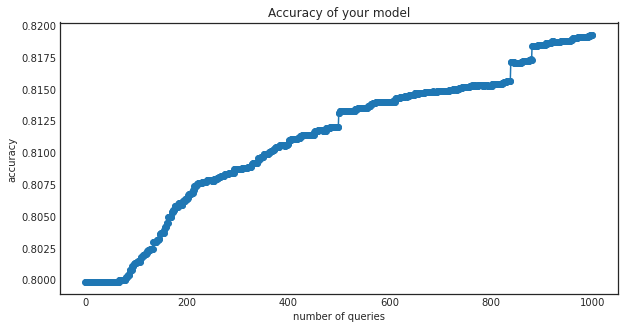

In [28]:
from tabulate import tabulate
import random
#Get accuracy on test data

#For i in range(0,20)
n_queries=1000
count_one_selected=0
for i in range(n_queries):
    #Clear the output
    #display.clear_output(wait=True)
    
    
    #Query the pool. Get the index and instance (example)
    query_idx, query_inst = learner.query(X_pool)
    #Here we need to show the un-normalized data to the user 
    simdict=dict()
    #ERGO DATA
    simdict['NAMESIM'] = [X_pool_copy[query_idx][0][0]]
    simdict['EMAILSIM'] = [X_pool_copy[query_idx][0][1]]
    simdict['PHONESIM'] = [X_pool_copy[query_idx][0][2]]
    simdict['ADDRESSSIM'] = [X_pool_copy[query_idx][0][3]]
    simdict['PINSIM'] = [X_pool_copy[query_idx][0][4]]
    simdict['CITYSIM'] = [X_pool_copy[query_idx][0][5]]
    simdict['STATESIM'] = [X_pool_copy[query_idx][0][6]]
    simdict['REGSIM'] = [X_pool_copy[query_idx][0][7]]
    simdict['CHASSISSIM'] = [X_pool_copy[query_idx][0][8]]
    
    simdf = pd.DataFrame(simdict)
    
    
    
    #print(simdf)
    
    #Get the input from user on this digit
    #y_new = np.array([int(input())], dtype=int)
    
    #Get input from the pool label
    y_new = np.array(y_pool[query_idx],dtype=int)
    #print("***")
    print(y_new)
    
    #Teach the learner based on this new label entered by a human
    #By default, teach does training on the whole training data plus the new queried examples seen till now
    learner.teach(query_inst.reshape(1, -1), y_new)
    print("\n\nESTIMATOR COEFFICIENTS: Iteration-"+str(i))
    print(learner.estimator.coef_.shape)
    #print(pd.DataFrame(learner.estimator.coef_.transpose(),simdf.columns,columns=['coef1','coef2','coef3']).sort_values(by=['coef1','coef2','coef3'], ascending=False))
    #Delete this example from the pool, as it has already been given feedback on
    X_pool, y_pool = np.delete(X_pool, query_idx, axis=0), np.delete(y_pool, query_idx, axis=0)
    X_pool_copy, y_pool_copy = np.delete(X_pool_copy, query_idx, axis=0), np.delete(y_pool_copy, query_idx, axis=0)
    #Accuracy for this iteration
    new_score=learner.score(X_test, y_test)
    #print("***********************************************************")
    #print_misclassified_examples(X_test,y_test,X_test_copy,y_test_copy)
    #print("***********************************************************")
    #Based on the teaching (from this example), recalculate the accuracy on the test set
    accuracy_scores.append(new_score)
print("Final accuracy after active learning:"+str(new_score))

#for i in range(0,len(accuracy_scores)):
with plt.style.context('seaborn-white'):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 1, 1)
    #plt.title('Digit to label')
    #Convert the sampled instance to the digit picture
    #plt.imshow(query_inst.reshape(8, 8))
    #plt.subplot(1, 2, 2)
    plt.title('Accuracy of your model')
    #Previous accuracy of the model
    plt.plot(range(n_queries+1), accuracy_scores)
    plt.scatter(range(n_queries+1), accuracy_scores)
    plt.xlabel('number of queries')
    plt.ylabel('accuracy')
    plt.savefig("accuracy_change.ergo.segregated."+str(n_queries)+".png")
    display.display(plt.gcf())
    plt.close('all')
    

# Experiments with Full Data

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('Ergo_Oct20_output.csv',delimiter = '\t')

In [3]:
df = df.drop('Index',axis=1)

In [4]:
df.columns

Index(['customer_code_x', 'name_x', 'chassis_num_x', 'veh_reg_num_x',
       'gender_x', 'mobile_x', 'email_x', 'dob_x', 'pan_x', 'pincode_x',
       'city_x', 'state_x', 'add_line1_x', 'add_line2_x', 'full_add_x',
       'landmark_x', 'customer_code_y', 'name_y', 'chassis_num_y',
       'veh_reg_num_y', 'gender_y', 'mobile_y', 'email_y', 'dob_y', 'pan_y',
       'pincode_y', 'city_y', 'state_y', 'add_line1_y', 'add_line2_y',
       'full_add_y', 'landmark_y', 'overallmatchtype', 'profilematchtype',
       'FINAL SCORE', 'PREDICTED', 'REASON', 'DOBSIM', 'GENDERSIM', 'NAMESIM',
       'EMAILSIM', 'PHONESIM', 'ADDRESSSIM', 'PINSIM', 'CITYSIM', 'STATESIM',
       'REGSIM', 'CHASSISSIM', 'PERCENTAGE'],
      dtype='object')

In [4]:
df.columns
old_cols = ['policy_num_x', 'customer_code_x', 'name_x', 'chassis_num_x', 'veh_reg_num_x', 'gender_x',
        'mobile_x', 'email_x','dob_x',  'pan_x','pincode_x', 'city_x', 'state_x', 'full_add_x','landmark_x',
        'policy_num_y', 'customer_code_y', 'name_y', 'chassis_num_y', 'veh_reg_num_y', 'gender_y',
        'mobile_y', 'email_y','dob_y',  'pan_y', 'pincode_y', 'city_y', 'state_y', 'full_add_y','landmark_y',
        'FINAL SCORE', 'PREDICTED', 'REASON', 'DOBSIM', 'GENDERSIM', 'NAMESIM', 'EMAILSIM', 'PHONESIM', 
        'ADDRESSSIM', 'PINSIM', 'CITYSIM', 'STATESIM','REGSIM', 'CHASSISSIM']


df.rename(columns={'overallmatchtype':'PREDICTED', 'sourcecuid':'customer_code_x', 'matchedcuid':'customer_code_y',
        'dob':'dob_x', 'gender':'gender_x', 'chassisno':'chassis_num_x','vehicleno':'veh_reg_num_x', 'emails':'email_x', 'contactnumbers', 'addresses', 'name',
       'firstname':'name_x', 'dob.1':'dob_y', 'gender.1':'gender_y', 'pan':'pan_x', 'name.1':'name_y','chassis_num':'chassis_num_y', 'veh_reg_num':'veh_reg_num_y',
       'mobile':'mobile_x', 'email':'email_y', 'pincode':'pincode_x', 'city':'city_x', 'state':'state_x', 'full_add':'full_add_x','firstname.1':'name_y','dob.2':'dob_y', 
       'gender.2':'gender_y', 'pan.1':'pan_y', 'name.2':'name_y', 'chassis_num.1':'chassis_num_y', 'veh_reg_num.1', 'mobile.1', 'email.1', 'pincode.1',
       'city.1':'city_y', 'state.1':'state_y', 'full_add.1':'full_add_y'}, inplace=True)

Index(['requestid', 'overallmatchtype', 'sourcecuid', 'matchedcuid',
       'profilematchtype', 'matchscore', 'dob', 'gender', 'chassisno',
       'vehicleno', 'emails', 'contactnumbers', 'addresses', 'name',
       'firstname', 'cuid', 'dob.1', 'gender.1', 'pan', 'name.1',
       'chassis_num', 'veh_reg_num', 'mobile', 'email', 'pincode', 'city',
       'state', 'add_line1', 'add_line2', 'landmark', 'full_add',
       'firstname.1', 'cuid.1', 'dob.2', 'gender.2', 'pan.1', 'name.2',
       'chassis_num.1', 'veh_reg_num.1', 'mobile.1', 'email.1', 'pincode.1',
       'city.1', 'state.1', 'add_line1.1', 'add_line2.1', 'landmark.1',
       'full_add.1'],
      dtype='object')